# Feature Categories

**Relative scaler spacial features.**
<br>
Using relative magnitudinal components which represent spacial locations within a domain, given the fixed boundary of that domain.

**Absolute value spacial features.**
<br>
Using absolute positions to represent spacial locations within a domain, sampled from the boundary of that domain.

**Vector features.**
<br>
Using direction and magnitude values to represent a control input.

**Auxilliary features.**
<br>
Using values which map to the one (or both) of the spacial & vector features.


# Initial Feature Exploration

- NB10422645/data/Geoffrey2D_Case1/dataSet_gridSampled_10.parquet

In [3]:
%cd "~/lab/NB10422645 (Stage - Airbus)"

#importing libraries
from sklearn import preprocessing
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
sns.set(style="ticks")
%matplotlib inline

/home/ggarrett/lab/NB10422645 (Stage - Airbus)


In [8]:
df1 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet_gridSampled_10.parquet")
df1_sample = df1.sample(100000)

By plotting a heatmap showing the correlation between all values within the dataset, a sense of the correlation between parameters can be given, for their preprocessed form.

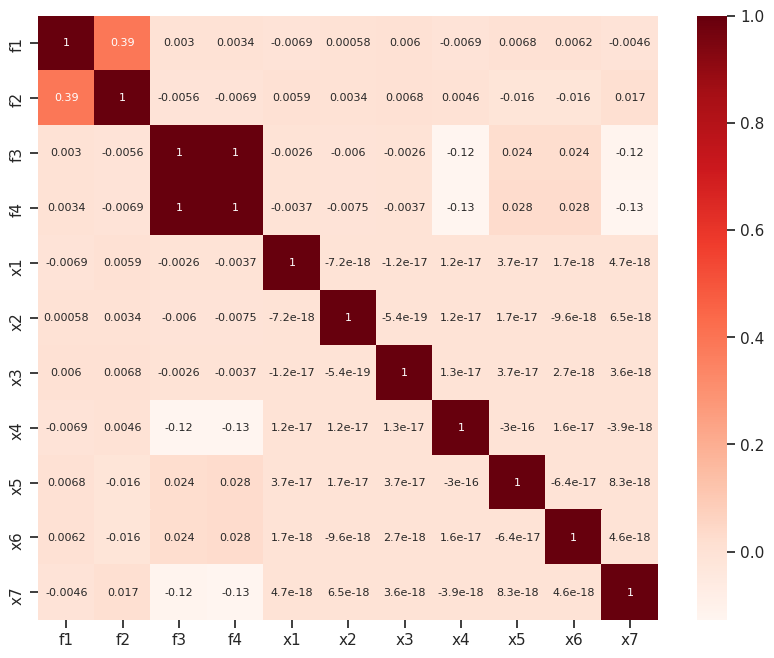

In [9]:
#Using Pearson Correlation
plt.figure(figsize=(10,8), dpi=100)
cor = df1.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, annot_kws={"size": 8})
plt.show()

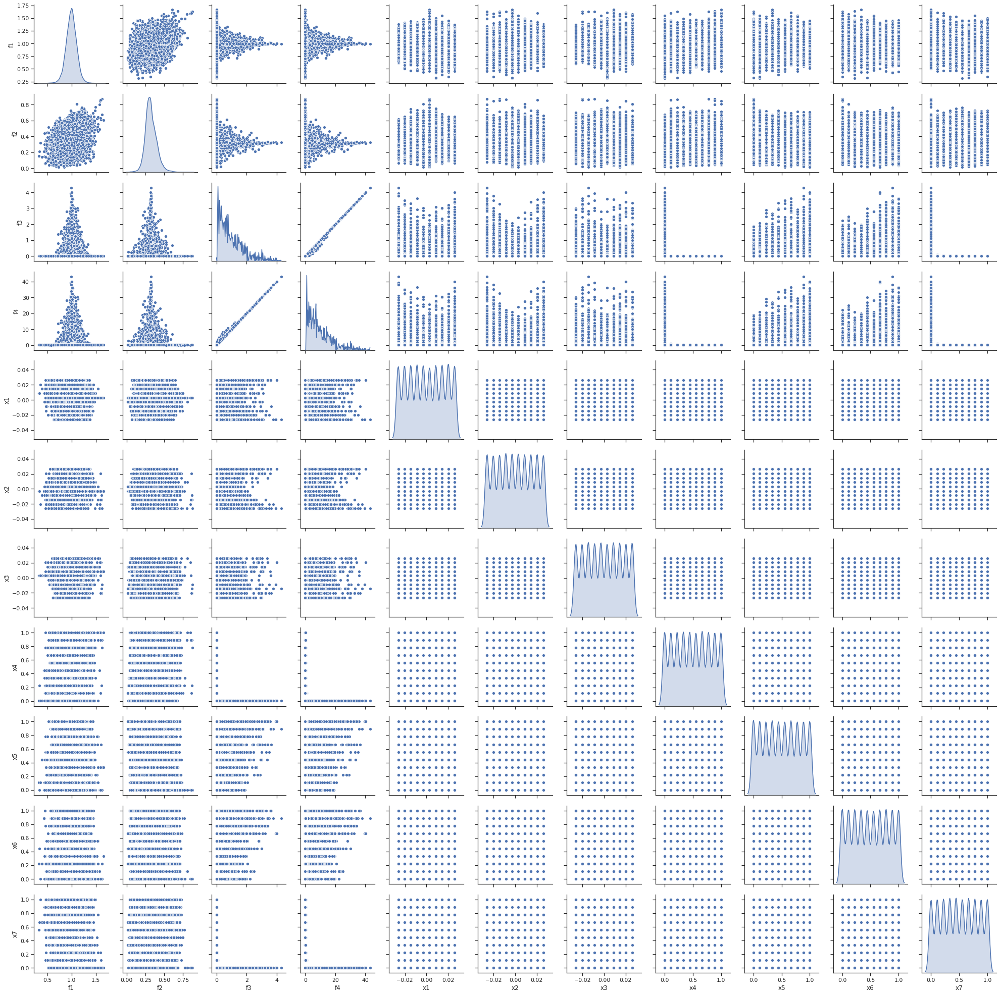

In [10]:
pp1 = sns.pairplot(df1_sample, diag_kind="kde")
plt.savefig("notebooks/graphics/dataSet_gridSampled_10_unprocessed_pairplot.png")

**Note 1**:
$x_4$, $x_5$, $x_6$ and $x_7$ can be representd by a point on a 4D sphere, as their relative size to eachother form a unique input. That is to say that $\overline{X}_{i,(4..7)} = \overline{X}_{j,(4..7)} = \{1.0, 1.0, 1.0, 1.0\} = \{0.1, 0.1, 0.1, 0.1\}$. Therefore these inputs shoud be normalized to a unit magnitude in order to reduce ambiguity in the input design vector.

**Note 2**: The relative difference between $\overline{X}_{1..3}$ and $\overline{X}_{4..7}$ can influence some machine learning algorithms to place more importance on $\overline{X}_{4..7}$ and therefore $\overline{X}_{1..3}$ should be scaled to [-1,1].

In [15]:
df2 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet_gridSampled_10.parquet")

t1_x_t = preprocessing.Normalizer()
t1_x_o = preprocessing.MinMaxScaler(feature_range=(-1,1))
t1_f_a = preprocessing.MinMaxScaler()

df2.loc[:,"x4":"x7"] = t1_x_t.fit_transform(df2.loc[:,"x4":"x7"].values)
df2.loc[:,"x1":"x3"] = t1_x_o.fit_transform(df2.loc[:,"x1":"x3"].values)
df2.loc[:,"f1":"f4"] = t1_f_a.fit_transform(df2.loc[:,"f1":"f4"].values)

df2_sample = df2.sample(100000)

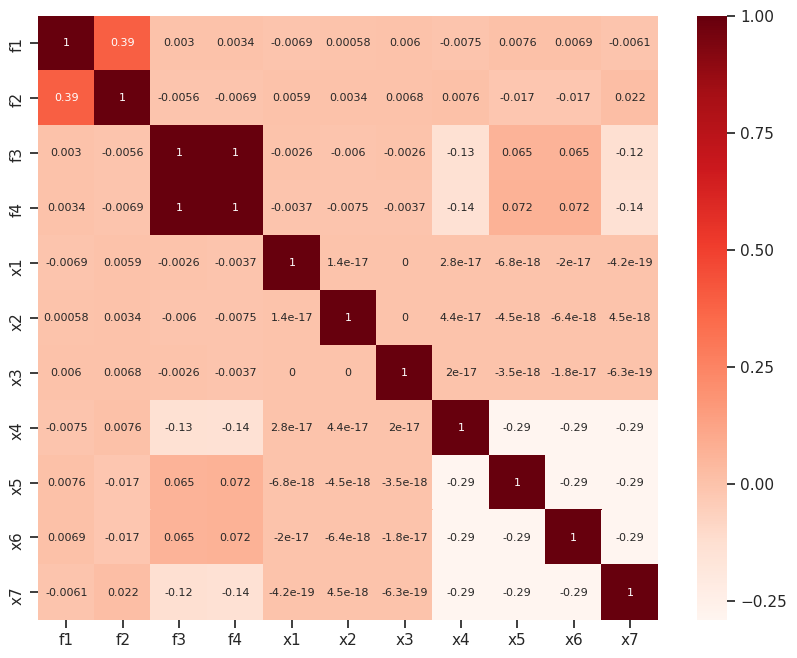

In [16]:
plt.figure(figsize=(10,8), dpi=100)
cor = df2.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, annot_kws={"size": 8})
plt.show()

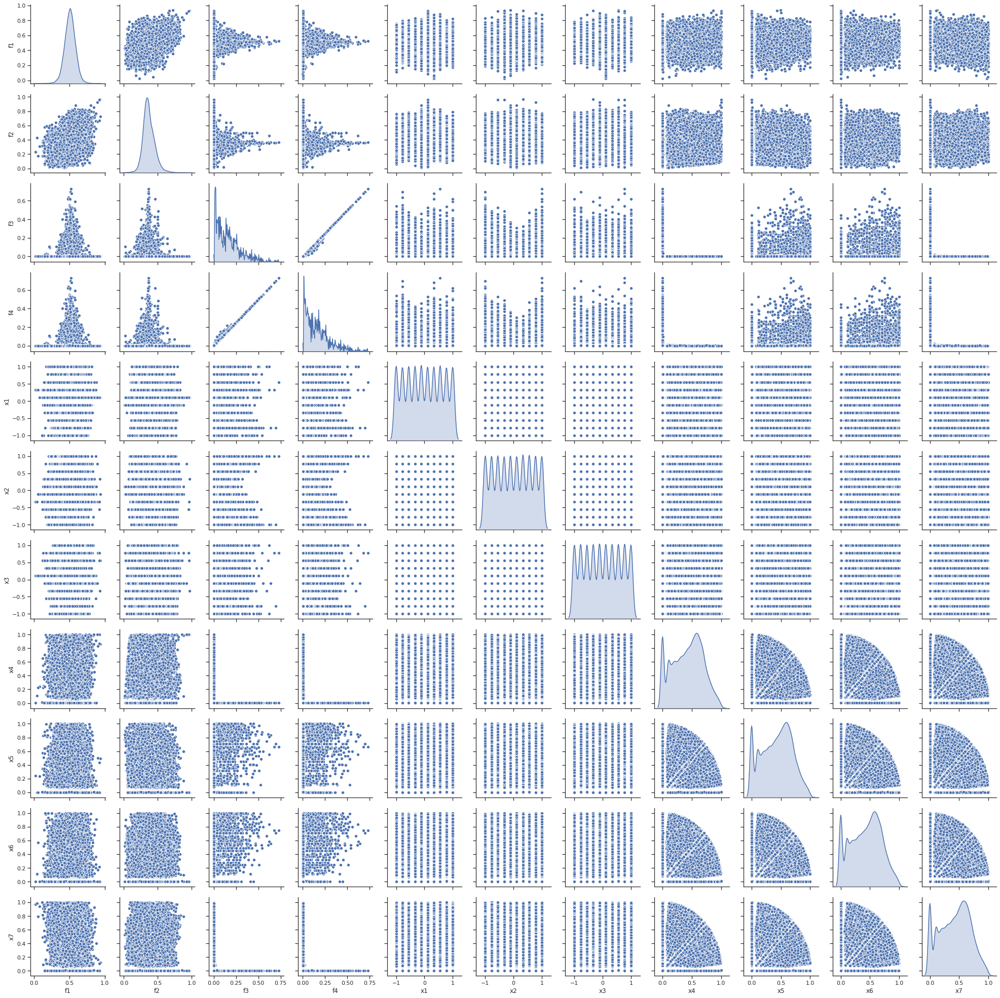

In [17]:
sns.pairplot(df2_sample, diag_kind="kde")
plt.savefig("notebooks/graphics/dataSet_gridSampled_10_processed_pairplot.png")

In [3]:
df3 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet_gridSampled_10.parquet")

t1_x_t = preprocessing.Normalizer()
t1_x_o_mm = preprocessing.MinMaxScaler(feature_range=(-1,1))
t1_x_o_nm = preprocessing.Normalizer()
t1_f_a = preprocessing.MinMaxScaler()

df3.loc[:,"x4":"x7"] = t1_x_t.fit_transform(df3.loc[:,"x4":"x7"].values)
df3.loc[:,"x1":"x3"] = t1_x_o_mm.fit_transform(df3.loc[:,"x1":"x3"].values)
df3.loc[:,"f1":"f4"] = t1_f_a.fit_transform(df3.loc[:,"f1":"f4"].values)

temp = df3.loc[:,"x1":"x3"].apply(np.square)
temp = np.sum(temp.values, axis=1)
df3["x8"] = np.sqrt(temp)

df3.loc[:,"x1":"x3"] = t1_x_o_nm.fit_transform(df3.loc[:,"x1":"x3"].values)

df3_sample = df3.sample(100000)

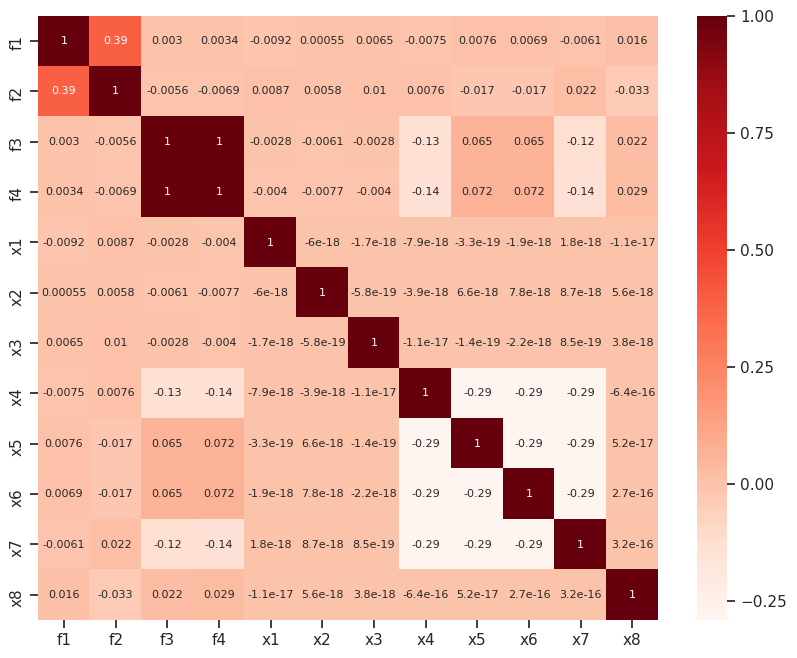

In [4]:
plt.figure(figsize=(10,8), dpi=100)
cor = df3.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, annot_kws={"size": 8})
plt.show()

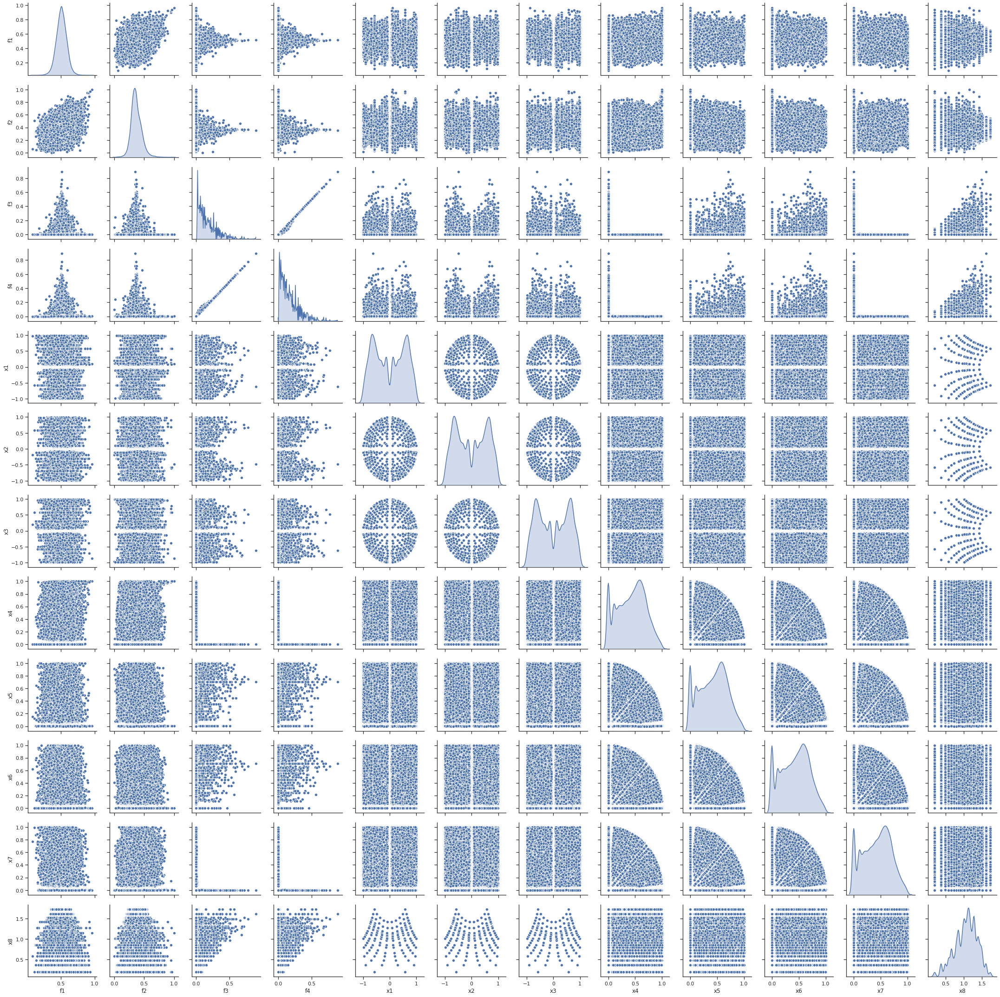

In [5]:
sns.pairplot(df3_sample, diag_kind="kde")
plt.savefig("notebooks/graphics/dataSet_gridSampled_10_processed2_pairplot.png")

# Dataset Filtering

In [2]:
df4 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet_gridSampled_10.parquet")

t1_x_t = preprocessing.Normalizer()
t1_x_o_mm = preprocessing.MinMaxScaler(feature_range=(-1,1))
t1_x_o_nm = preprocessing.Normalizer()
t1_f_a = preprocessing.MinMaxScaler()

# x4:x7 pre.
df4.loc[:,"x4":"x7"] = t1_x_t.fit_transform(df4.loc[:,"x4":"x7"].values)

# Filtering
df4.drop(index=df4[df4["x4"]<=0.05].index, inplace=True)
df4.drop(index=df4[df4["x5"]<=0.05].index, inplace=True)
df4.drop(index=df4[df4["x6"]<=0.05].index, inplace=True)
df4.drop(index=df4[df4["x7"]<=0.05].index, inplace=True)

# x1:x3 pre.
df4.loc[:,"x1":"x3"] = t1_x_o_mm.fit_transform(df4.loc[:,"x1":"x3"].values)

# Adding feature from x1:x3.
temp = df4.loc[:,"x1":"x3"].apply(np.square)
temp = np.sum(temp.values, axis=1)
df4["x8"] = np.sqrt(temp)

# x1:x3 post.
df4.loc[:,"x1":"x3"] = t1_x_o_nm.fit_transform(df4.loc[:,"x1":"x3"].values)

# f1:f4 pre.
df4.loc[:,"f1":"f4"] = t1_f_a.fit_transform(df4.loc[:,"f1":"f4"].values)

df4_sample = df4.sample(100000)


NameError: name 'preprocessing' is not defined

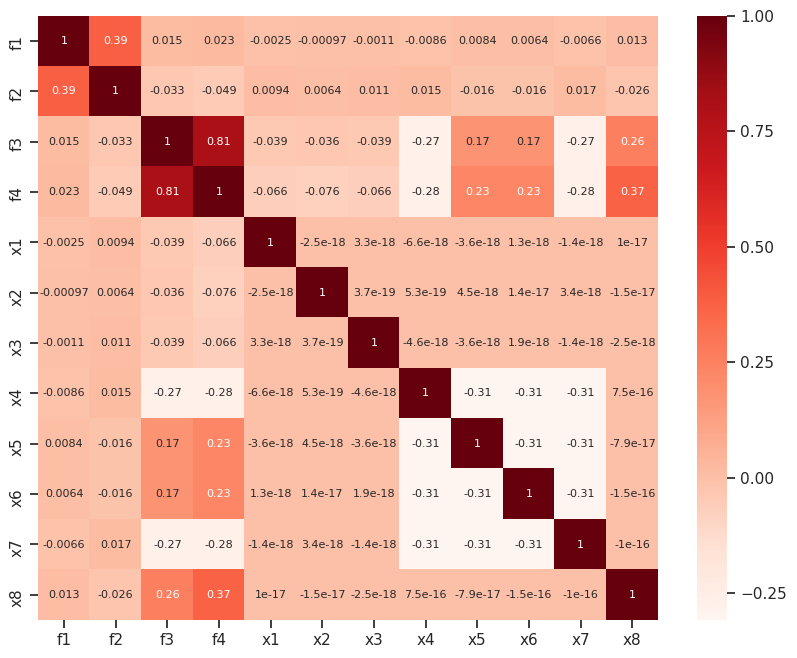

In [35]:
plt.figure(figsize=(10,8), dpi=100)
cor = df4.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, annot_kws={"size": 8})
plt.show()

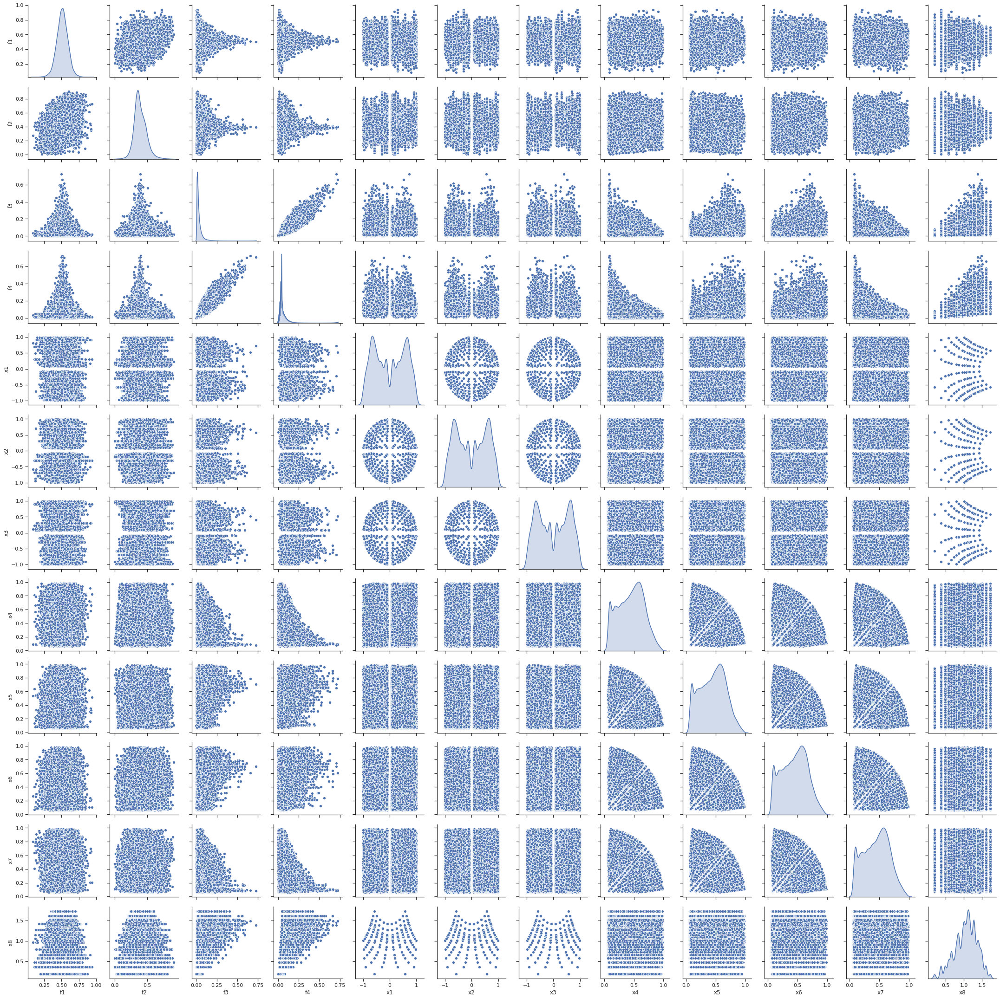

In [33]:
sns.pairplot(df4_sample, diag_kind="kde")
plt.savefig("notebooks/graphics/dataSet_gridSampled_10_processed2_filterd_pairplot.png")

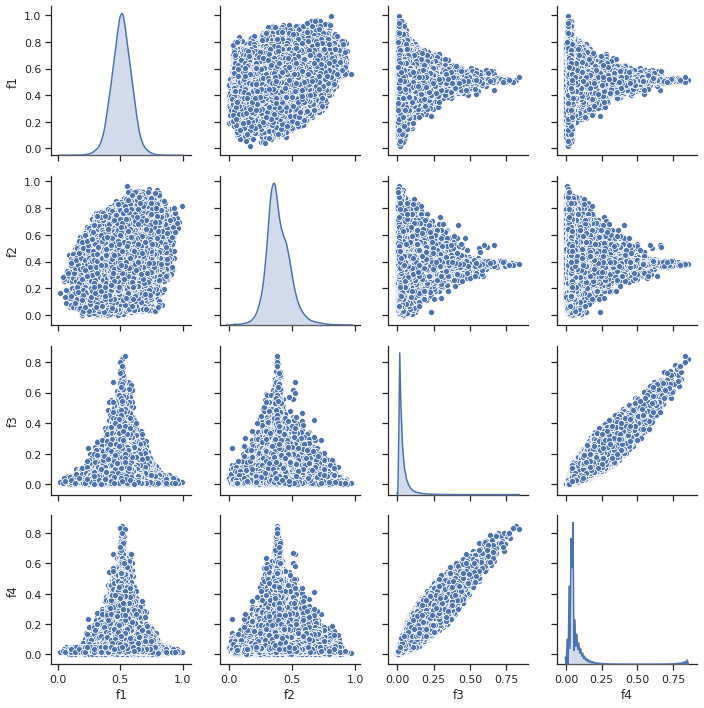

In [37]:
sns.pairplot(df4.sample(1000000).loc[:,"f1":"f4"], diag_kind="kde")
plt.savefig("notebooks/graphics/test.png")

In [1]:
%cd "~/lab/NB10422645 (Stage - Airbus)"

#importing libraries
from sklearn import preprocessing
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
sns.set(style="ticks")
%matplotlib inline

/home/ggarrett/lab/NB10422645 (Stage - Airbus)


In [12]:
df4 = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet_gridSampled_9.parquet")

t1_x_t = preprocessing.Normalizer()
t1_x_o_mm = preprocessing.MinMaxScaler(feature_range=(-1,1))
t1_x_o_nm = preprocessing.Normalizer()
t1_f_a = preprocessing.MinMaxScaler()

# x4:x7 pre.
df4.loc[:,"x4":"x7"] = t1_x_t.fit_transform(df4.loc[:,"x4":"x7"].values)

# Filtering
df4.drop(index=df4[df4["x4"]<=0.05].index, inplace=True)
df4.drop(index=df4[df4["x5"]<=0.05].index, inplace=True)
df4.drop(index=df4[df4["x6"]<=0.05].index, inplace=True)
df4.drop(index=df4[df4["x7"]<=0.05].index, inplace=True)

# x1:x3 pre.
df4.loc[:,"x1":"x3"] = t1_x_o_mm.fit_transform(df4.loc[:,"x1":"x3"].values)

# Adding feature from x1:x3.
temp = df4.loc[:,"x1":"x3"].apply(np.square)
temp = np.sum(temp.values, axis=1)
res = np.sqrt(temp)
df4["x8"] = res

# x1:x3 post.
df4.loc[:,"x1":"x3"] = t1_x_o_nm.fit_transform(df4.loc[:,"x1":"x3"].values)

# f1:f4 pre.
df4.loc[:,"f1":"f4"] = t1_f_a.fit_transform(df4.loc[:,"f1":"f4"].values)

# df4_sample = df4.sample(100000)

In [120]:
df_ch = pd.read_parquet("data/AttitudeTrajectoryProblem2D_C1_R1/dataSet_gridSampled_6.parquet")

t3 = preprocessing.StandardScaler()
t2 = preprocessing.MinMaxScaler()
t1 = preprocessing.Normalizer()

# x4:x7 pre.
df_ch.loc[:,"x4":"x7"] = t1.fit_transform(df_ch.loc[:,"x4":"x7"].values)
df_ch.loc[:,:] = t3.fit_transform(t2.fit_transform(df_ch.values))

# t1_x_o_mm = preprocessing.MinMaxScaler(feature_range=(-1,1))
# t1_x_o_nm = preprocessing.Normalizer()
# t1_f_a = preprocessing.MinMaxScaler()

# df4.loc[:,:] = t1_x_t1.fit_transform(t1_x_t2.fit_transform(df4.values))


print(df_ch)

# df4_sample = df4.sample(100000)

              f1        f2        f3        f4       x1       x2       x3  \
0      -0.071003  0.600921 -0.129330 -0.104408 -1.46385 -1.46385 -1.46385   
1      -0.089178 -1.524365 -0.121366 -0.130287 -1.46385 -1.46385 -1.46385   
2      -0.497077 -1.447357 -0.113322 -0.130416 -1.46385 -1.46385 -1.46385   
3      -0.590062 -1.420736 -0.105278 -0.130459 -1.46385 -1.46385 -1.46385   
4      -0.679790 -1.377572 -0.103311 -0.130480 -1.46385 -1.46385 -1.46385   
...          ...       ...       ...       ...      ...      ...      ...   
279931  0.677399  0.517809 -0.128062 -0.091953  1.46385  1.46385  1.46385   
279932 -0.032822 -0.524408 -0.128881 -0.097722  1.46385  1.46385  1.46385   
279933 -0.170478 -0.514070 -0.129148 -0.102052  1.46385  1.46385  1.46385   
279934  0.916589  0.007253 -0.129278 -0.105420  1.46385  1.46385  1.46385   
279935  0.030968  0.496059 -0.129353 -0.108115  1.46385  1.46385  1.46385   

              x4        x5        x6        x7  
0       0.293888  0.293888

In [122]:
%cd "~/lab/NB10422645 (Stage - Airbus)/"
from src.dataset import DataSetFX
from src.surrogate.deeplearning.core import *


F=df_ch.loc[:,"f1":"f2"].values
X=df_ch.loc[:,"x1":"x8"].values

ds_test = DataSetFX(input=X, output=F)

# Deep learning imports.
import torch.nn as nn
import torch 
from collections import OrderedDict
from scipy import io
from src.surrogate.modules import ResidualBlock, BasicBlock, nn

# Visual.
import matplotlib
import matplotlib.pyplot as plt

# Define modular structure of model 1.
def get_model1_module(hidden_size, data_set, batch_norm=False):
    """
    :param hidden_size: number of neurons for the two hidden layers.
    :param data_set: the dataset being used, for defining input and output size.
    :param batch_norm: the inclusion of batch normalisation after each hidden layer.
    """
    _sequence = []
    # --- ##  Hidden layer 1
    _sequence.append(('fc1', nn.Linear(data_set.input_size, hidden_size)))
    # - Sigmoid activation
    _sequence.append(('sigmoid1', nn.Sigmoid()))      
    # Conditional
    if batch_norm:
        _sequence.append(('bn1', nn.BatchNorm1d(hidden_size))) 
    # --- ##  Hidden layer 2
    _sequence.append(('fc2', nn.Linear(hidden_size, hidden_size)))      
    # - ReLU activation
    _sequence.append(('relu2', nn.ReLU()))
        # Conditional
    if batch_norm:
        _sequence.append(('bn2', nn.BatchNorm1d(hidden_size))) 
        # --- ##  Hidden layer 3
    _sequence.append(('fc3', nn.Linear(hidden_size, hidden_size)))      
    # - ReLU activation
    _sequence.append(('relu3', nn.ReLU()))
    # - Conditional 
    if batch_norm:
        _sequence.append(('bn3', nn.BatchNorm1d(hidden_size)))                 
    # --- # Output layer
    _sequence.append(('output', nn.Linear(hidden_size, data_set.output_size))) 
    return nn.Sequential(OrderedDict(_sequence))

print(ds_test.input_size)
print(ds_test.output_size)

# Define quantity of neurons in hidden layers.
model1_4_hidden_size = 1000
model1_4_batch_norm  = True
model1_4_scheduler = True
model1_4_root_name = f"model1_h{model1_4_hidden_size}_lr0.1_bn{model1_4_batch_norm}_scheduler{model1_4_scheduler}"

# model_1 = get_model1_module(model1_4_hidden_size, ds_test, model1_4_batch_norm)
# model_1 = get_model1_module(model1_4_hidden_size, ds_test, model1_4_batch_norm)

model_1 = nn.Sequential(
    BasicBlock(ds_test.input_size, model1_4_hidden_size,  activation="selu"),
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size,  activation="sig"),
    
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
    
    BasicBlock(int(model1_4_hidden_size *1.0), int(model1_4_hidden_size *0.8),  activation="leaky_relu"),
    
    BasicBlock(int(model1_4_hidden_size *0.8), int(model1_4_hidden_size *0.8),  activation="leaky_relu"),
    BasicBlock(int(model1_4_hidden_size *0.8), int(model1_4_hidden_size *0.8),  activation="leaky_relu"),
    
    BasicBlock(int(model1_4_hidden_size *0.8), int(model1_4_hidden_size *0.6),  activation="leaky_relu"),
    
    BasicBlock(int(model1_4_hidden_size *0.6), int(model1_4_hidden_size *0.6),  activation="leaky_relu"),
    BasicBlock(int(model1_4_hidden_size *0.6), int(model1_4_hidden_size *0.6),  activation="leaky_relu"),
    
    BasicBlock(int(model1_4_hidden_size *0.6), int(model1_4_hidden_size *0.4),  activation="leaky_relu"),
    
    BasicBlock(int(model1_4_hidden_size *0.4), int(model1_4_hidden_size *0.4),  activation="leaky_relu"),
    BasicBlock(int(model1_4_hidden_size *0.4), int(model1_4_hidden_size *0.4),  activation="leaky_relu"),
    
#     BasicBlock(model1_4_hidden_size*2, model1_4_hidden_size,  activation="leaky_relu"),
    
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size *2,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size*2, model1_4_hidden_size,  activation="leaky_relu"),
    
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size *2,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size*2, model1_4_hidden_size,  activation="leaky_relu"),
    
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size *2,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size*2, model1_4_hidden_size,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size*2,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size*2, model1_4_hidden_size,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size, model1_4_hidden_size*2,  activation="leaky_relu"),
#     BasicBlock(model1_4_hidden_size*2, model1_4_hidden_size,  activation="leaky_relu"),

    
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
#     ResidualBlock(model1_4_hidden_size, activation="leaky_relu"),
    
#     ResidualBlock(model1_4_hidden_size,  activation="leaky_relu"),
    BasicBlock(int(model1_4_hidden_size *0.4), ds_test.output_size, activation="sig")
)

# model_1 = nn.Sequential(BasicBlock(ds_test.input_size, model1_4_hidden_size,  activation="leaky_relu"),)
#     *[]
# BasicBlock(model1_4_hidden_size, ds_test.output_size, activation="selu"))

# print(model_1)
model_folder = f"models/{model1_4_root_name}_{ds_test.name}"
# print(model_folder)
trainer = Trainer(model_folder, ds_test, model_1, torch.optim.SGD, torch.nn.MSELoss, num_epochs=4000, batch_size=int(1e6), learning_rate=1e-1)
trainer.add_scheduler(torch.optim.lr_scheduler.MultiStepLR, milestones=[1000, 3000], gamma=0.1)
trainer.train()

/home/ggarrett/lab/NB10422645 (Stage - Airbus)
7
2
Epoch [  1  /4000 ]  |  Train Loss:  2.003875  |  Test Loss:  1.686282  |  lr:  0.10000
Epoch [  2  /4000 ]  |  Train Loss:  1.637549  |  Test Loss:  1.498236  |  lr:  0.10000
Epoch [  3  /4000 ]  |  Train Loss:  1.408593  |  Test Loss:  1.395674  |  lr:  0.10000
Epoch [  4  /4000 ]  |  Train Loss:  1.267292  |  Test Loss:  1.344941  |  lr:  0.10000
Epoch [  5  /4000 ]  |  Train Loss:  1.241280  |  Test Loss:  1.261241  |  lr:  0.10000
Epoch [  6  /4000 ]  |  Train Loss:  1.148918  |  Test Loss:  1.209854  |  lr:  0.10000
Epoch [  7  /4000 ]  |  Train Loss:  1.066364  |  Test Loss:  1.184127  |  lr:  0.10000
Epoch [  8  /4000 ]  |  Train Loss:  1.077881  |  Test Loss:  1.135840  |  lr:  0.10000
Epoch [  9  /4000 ]  |  Train Loss:  0.988273  |  Test Loss:  1.119562  |  lr:  0.10000
Epoch [ 10  /4000 ]  |  Train Loss:  0.991885  |  Test Loss:  1.102004  |  lr:  0.10000
Epoch [ 11  /4000 ]  |  Train Loss:  0.965976  |  Test Loss:  1.07292

SystemExit: 0

In [ ]:
model_1   # 10 : 0.005440

In [123]:
%cd "~/lab/NB10422645 (Stage - Airbus)/"

from src.problems.two_dimensional import *
test_geometry = MissionGeometry()
test_design = NOmegaPointsScaleBasedPeriodic(int(test_geometry.P_s / 10), 3)
test_spacecraft = Spacecraft()
test_problem = AttitudeTrajectoryProblem2D(test_geometry, test_spacecraft, test_design)

/home/ggarrett/lab/NB10422645 (Stage - Airbus)


In [135]:
# import plotly.graph_objects as go
import plotly.offline as pyo
from plotly import graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# import plotly.graph_objects as go
import numpy as np


# LOAD MODEL

# Define quantity of neurons in hidden layers.
model1_4_hidden_size = model1_4_hidden_size
model1_4_batch_norm  = True
model1_4_scheduler = True
model1_4_root_name = f"model1_h{model1_4_hidden_size}_lr0.1_bn{model1_4_batch_norm}_scheduler{model1_4_scheduler}"

# model_1 = get_model1_module(model1_4_hidden_size, ds_test, model1_4_batch_norm)
# model_1 = get_model1_module(model1_4_hidden_size, ds_test, model1_4_batch_norm)

# model_1 = nn.Sequential(
#     BasicBlock(ds_test.input_size, model1_4_hidden_size),
#     ResidualBlock(model1_4_hidden_size),
#     ResidualBlock(model1_4_hidden_size),
#     BasicBlock(model1_4_hidden_size, ds_test.output_size)
# )

# print(model_1)
model_folder = f"models/save/{model1_4_root_name}_{ds_test.name}"
# print(model_folder)
trainer = Trainer(model_folder, ds_test, model_1, torch.optim.SGD, torch.nn.MSELoss, num_epochs=1000, batch_size=10000, learning_rate=1e-1)

trainer.load_checkpoint(model_folder)

# trainer.add_scheduler(torch.optim.lr_scheduler.MultiStepLR, milestones=[100, 850], gamma=0.1)
# trainer.train()

# TEST DOMAIN
from src.notebooks.constraint_manifold_sampling import *
grid = sampled_grid(np.array(test_problem.design_space.get_bounds)[:,[3,4]], 10, flatten=False)
# grid = pd.DataFrame(grid).T
# print(grid)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 

from copy import deepcopy

model_1.eval()

def get_actual(xi,xj, x_idx=[3,4], fixed_x=[+0.01, -0.01, +0.01, 0.5, 0.5], f_idx=0):
#     assert len(fixed_x) + 2 == len(test_problem.design_space.get_bounds[0])

    temp = deepcopy(fixed_x)
    temp.insert(x_idx[0], xi)
    temp.insert(x_idx[1], xj)
    temp = np.array(temp)
    temp[-4:] /= np.linalg.norm(temp[-4:])
    
    f = test_problem.fitness(temp)

    return f[f_idx]

def get_predict(xi,xj, x_idx=[3,4], fixed_x=[+0.01, -0.01, +0.01, 0.5, 0.5], f_idx=0):
#     assert len(fixed_x) + 2 == len(test_problem.design_space.get_bounds[0])
    
    temp = deepcopy(fixed_x)
    temp.insert(x_idx[0], xi)
    temp.insert(x_idx[1], xj)
    temp = np.array(temp)
    temp[-4:] /= np.linalg.norm(temp[-4:])
    
    temp[:3] = t1_x_o_mm.transform(temp[:3].reshape(1,-1))
    
    norm_f3_ =  np.linalg.norm(temp[:3])
    temp = np.concatenate((temp, [norm_f3_]))
    temp[:3] /= norm_f3_
    
    temp = temp.reshape(1,-1)
    predicted = model_1(torch.tensor(temp).float().to(device)).detach().cpu().numpy()
    predicted = t1_f_a.inverse_transform(np.concatenate((predicted[0], [0,0])).reshape(1,-1))
#     predicted = predicted[:2]
#     print(predicted)
    return predicted[0][f_idx]

In [136]:
# print(t1_f_a.min_)
actual    = np.vectorize(get_actual)(grid[0], grid[1], f_idx=0)
predicted = np.vectorize(get_predict)(grid[0], grid[1], f_idx=0)

print(actual)

print(predicted)

se = np.sqrt(np.abs(predicted - actual))
mse = np.mean(se)
print(mse)
# print(se)

ValueError: operands could not be broadcast together with shapes (1,9) (11,) (1,9) 

In [133]:

fig = go.Figure(data=[
#     go.Surface(z=actual),
    go.Surface(z=predicted, showscale=False, opacity=0.9),
#     go.Surface(z=z3, showscale=False, opacity=0.9)

])

fig.show()

In [106]:
fig = go.Figure(data=[
    go.Surface(z=actual),
#     go.Surface(z=predicted, showscale=False, opacity=0.9),
#     go.Surface(z=z3, showscale=False, opacity=0.9)

])

fig.show()